In [1]:
import s3fs
import boto3
import time

from PIL import Image
import numpy as np
import hashlib
import io
import json
import gc
import joblib


!pip install pytorch_pretrained_vit

import s3fs
import boto3
import time
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import hashlib
import io
import json
import gc
from tqdm import tqdm
import pandas as pd
import os

import torch
from pytorch_pretrained_vit import ViT
from torchvision import models
from torchvision import transforms, models
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.transforms import v2
from torch.utils.data import DataLoader,Dataset

import torch.nn as nn
from torch.nn import functional as F
import torch.optim as optim

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay,classification_report, accuracy_score

  Preparing metadata (setup.py) ... done
  Created wheel for pytorch_pretrained_vit: filename=pytorch_pretrained_vit-0.0.7-py3-none-any.whl size=11114 sha256=b1b756df28a091535bcf962fb15c0022997eef5a9659b87b7c8a46bc81c81c59
  Stored in directory: /home/ec2-user/.cache/pip/wheels/2d/46/ad/12007be9d377d0fbf27ef75b6e47ed92832ab6b70dbf004b6f
Successfully built pytorch_pretrained_vit


In [2]:
def init_clients():
    return boto3.client("s3"), s3fs.S3FileSystem()

boto3_s3, s3fs_ = init_clients()

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print()

Using device: cuda



In [4]:
def data_loading(path):
    with open(path, 'r') as file:
        test_data = json.load(file)
    x = list(test_data.keys())
    y = list(test_data.values())
    train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.3, random_state=42,stratify=y)
    return train_x, test_x, train_y, test_y

In [5]:
def data_loading_COMPCAR():
    train_x, test_x, train_y, test_y = data_loading('TESTDATA.json')

    with open('COMPCAR.json', 'r') as file:
        test_data = json.load(file)
    x = list(test_data.keys())
    y = list(test_data.values())
    train_x_2, test_x_2, train_y_2, test_y_2 = train_test_split(x, y, test_size=0.90, random_state=42,stratify=y)

    train_x.extend(train_x_2)
    train_y.extend(train_y_2)
    
    test_x.extend(test_x_2[:1500])
    test_y.extend(test_y_2[:1500])
    return train_x, test_x, train_y, test_y

In [6]:
def preprocess_image(image_bytes):
    # Open the image as bytes
    image = Image.open(io.BytesIO(image_bytes))

    # Convert to grayscale
    if image.mode != 'RGB':
        image = image.convert('RGB')

    # Convert image to numpy array
    image_np = np.array(image)

    # Convert the numpy array to PyTorch tensor
    image_tensor = torch.tensor(image_np)

    # Convert the tensor to 3D RGB (if it's not already)
    if len(image_tensor.shape) == 2:
        image_tensor = image_tensor.unsqueeze(0)  # Add batch dimension
    image_tensor = image_tensor.permute(2, 0, 1)  # Convert HWC to CHW

    # Normalize to [0, 1]
    image_tensor = image_tensor.float() / 255.0

    return image_tensor


def process_duplicates_image_ids(model, image_paths: list, batch_size: int,
                                 bucket: str, boto_s3: boto3.client("s3"), 
                                 s3fs_: s3fs.S3FileSystem(), target_size=(256, 256)):
    image_tensors = []
    for i in range(0, len(image_paths), batch_size):
        batch_image_paths = image_paths[i:i + batch_size]
        batch_image_tensors = []
        for ad_image in batch_image_paths:
            if ad_image.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_path = "/".join(ad_image.split("/")[1:])
                s3_object = boto_s3.get_object(Bucket=bucket, Key=image_path)
                image_bytes = s3_object['Body'].read()
                image_tensor = preprocess_image(image_bytes)
                batch_image_tensors.append(image_tensor)
        # Resize or crop images to the target size before stacking
        batch_image_tensors_resized = [transforms.functional.resize(image, target_size) for image in batch_image_tensors]
        image_tensors.append(torch.stack(batch_image_tensors_resized))

    # Concatenate processed batches
    processed_image_tensors = torch.cat(image_tensors, dim=0)

    # Display the shape and dtype of the tensor
    print("Tensor Shape:", processed_image_tensors.shape)
    print("Tensor Dtype:", processed_image_tensors.dtype)

    return processed_image_tensors

In [7]:
def show_matrix(test_y_svm,y_pred,filename=None):
    print(classification_report(test_y_svm, y_pred))
    cm = confusion_matrix(test_y_svm, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['interior','exterior'])
    disp.plot()
    if filename:
        plt.savefig(filename)
    else:
        plt.show()

In [8]:
def fit_train_embeddings(im_train,train_y):
    start_time = time.time()
    weights = ResNet50_Weights.DEFAULT
    model = resnet50(weights=weights).to(device)
    model.eval()


    data_loader = DataLoader(im_train, batch_size=32, shuffle=False)
    embeddings = []

    with torch.no_grad():
        for batch in data_loader:
            batch = batch.to(device)
            embedding_batch = model(batch)
            embeddings.append(embedding_batch)

    train_embeddings = torch.cat(embeddings, dim=0).cpu().numpy()
    
    svm_classifier = SVC(kernel='rbf', random_state=42)
    svm_classifier.fit(train_embeddings, train_y)
    end_time = time.time()
    print("Time taken for training:", end_time - start_time, "seconds")
    return svm_classifier

In [9]:
def predict_test_embeddings(im_test,svm_classifier):
    start_time = time.time()
    weights = ResNet50_Weights.DEFAULT
    model = resnet50(weights=weights).to(device)
    model.eval()


    data_loader = DataLoader(im_test, batch_size=32, shuffle=False)
    embeddings = []

    with torch.no_grad():
        for batch in data_loader:
            batch = batch.to(device)
            embedding_batch = model(batch)
            embeddings.append(embedding_batch)

    embeddings_test = torch.cat(embeddings, dim=0).cpu().numpy()
    y_pred = svm_classifier.predict(embeddings_test)
    end_time = time.time()
    print("Time taken for testing:", end_time - start_time, "seconds")
    return y_pred

In [10]:
def trained_SVM():
    train_x, test_x, train_y, test_y = data_loading_COMPCAR()
    gc.collect()
    im_train = process_duplicates_image_ids('ResNet',image_paths=train_x,batch_size=100,bucket="dpgos-osdata-boaz-beukers-sandbox",
            boto_s3=boto3_s3,
            s3fs_=s3fs_)
    im_test = process_duplicates_image_ids('ResNet',image_paths=test_x,batch_size=100,bucket="dpgos-osdata-boaz-beukers-sandbox",
            boto_s3=boto3_s3,
            s3fs_=s3fs_)

    svm_classifier = fit_train_embeddings(im_train,train_y)
    result = predict_test_embeddings(im_test,svm_classifier)
    show_matrix(test_y,result,filename='trained_SVM_classifier_results.png')
    return svm_classifier, result

/home/ec2-user/anaconda3/envs/pytorch_p310/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Tensor Shape: torch.Size([5324, 3, 256, 256])
Tensor Dtype: torch.float32
Tensor Shape: torch.Size([2661, 3, 256, 256])
Tensor Dtype: torch.float32


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /home/ec2-user/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 172MB/s]


Time taken for training: 31.963963508605957 seconds
Time taken for testing: 10.243030071258545 seconds
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1477
           1       0.99      0.98      0.99      1184

    accuracy                           0.99      2661
   macro avg       0.99      0.99      0.99      2661
weighted avg       0.99      0.99      0.99      2661



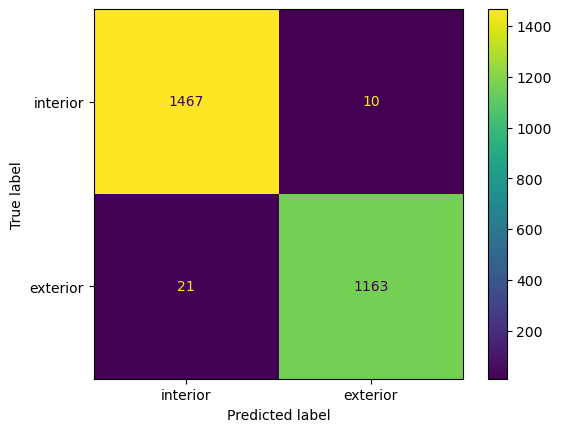

In [11]:
svm_classifier, result = trained_SVM()

# Save trained model

In [12]:
# save
joblib.dump(svm_classifier, "interior_exterior_model.pkl") 

['interior_exterior_model.pkl']

In [11]:
def read_zoom_in():
    # Read the CSV file into a pandas DataFrame
    df = pd.read_csv('ZOOMIN.csv')
    del df['Unnamed: 0']
    train_x, test_x, train_y, test_y = train_test_split(df['img_path'], df['label'], test_size=0.3, random_state=42,stratify=df['label'])
    train_x, test_x, train_y, test_y =  train_x[:4000], test_x[:1000], train_y[:4000], test_y[:1000]
    return np.array(train_x), np.array(test_x), np.array(train_y), np.array(test_y)

def read_csv_file():
    df = pd.read_csv('compcars-angle.csv')
    del df['Unnamed: 0']
    train_x, test_x, train_y, test_y = train_test_split(df['img_path'], df['label'], test_size=0.3, random_state=42, stratify=df['label'])
    train_x, test_x, train_y, test_y = train_x[:12000], test_x[:3661], train_y[:12000], test_y[:3661]
    train_x_2, test_x_2, train_y_2, test_y_2 = read_zoom_in()
    train_x = np.concatenate((train_x, train_x_2))
    train_y = np.concatenate((train_y, train_y_2))
    test_x = np.concatenate((test_x, test_x_2))
    test_y = np.concatenate((test_y, test_y_2))
    return np.array(train_x), np.array(test_x), np.array(train_y), np.array(test_y)


In [12]:
def preprocess_image_angle(image_bytes, byte=True):
    # Open the image as bytes
    if byte is True:
        image = Image.open(io.BytesIO(image_bytes))
    if byte is False:
        image = Image.open(image_bytes)
    # Convert to grayscale
    if image.mode != 'RGB':
        image = image.convert('RGB')

    # Convert image to numpy array
    image_np = np.array(image)

    # Convert the numpy array to PyTorch tensor
    image_tensor = torch.tensor(image_np)

    # Convert the tensor to 3D RGB (if it's not already)
    if len(image_tensor.shape) == 2:
        image_tensor = image_tensor.unsqueeze(0)  # Add batch dimension
    image_tensor = image_tensor.permute(2, 0, 1)  # Convert HWC to CHW

    # Normalize to [0, 1]
    image_tensor = image_tensor.float() / 255.0

    return image_tensor


def process_duplicates_image_ids_angle(image_paths: list, batch_size: int,
                                 bucket: str, boto_s3: boto3.client("s3"), 
                                 s3fs_: s3fs.S3FileSystem(), target_size=(384, 384)):
    image_tensors = []
    for i in tqdm(range(0, len(image_paths), batch_size), total=len(image_paths)//batch_size, desc='Processing Images'):
        batch_image_paths = image_paths[i:i + batch_size]
        batch_image_tensors = []
        for ad_image in batch_image_paths:
            if ad_image.lower().startswith("dpgos-osdata-boaz-beukers-sandbox"):
                image_path = "/".join(ad_image.split("/")[1:])
                s3_object = boto_s3.get_object(Bucket=bucket, Key=image_path)
                image_bytes = s3_object['Body'].read()
                image_tensor = preprocess_image_angle(image_bytes,True)
                batch_image_tensors.append(image_tensor)
            if os.path.isfile(ad_image) and ad_image.lower().startswith("datasets/"):
                image_tensor = preprocess_image_angle(ad_image,False)
                batch_image_tensors.append(image_tensor)
        # Resize or crop images to the target size before stacking
        batch_image_tensors_resized = [transforms.functional.resize(image, target_size) for image in batch_image_tensors]
        image_tensors.append(torch.stack(batch_image_tensors_resized))

    # Concatenate processed batches
    processed_image_tensors = torch.cat(image_tensors, dim=0)

    # Display the shape and dtype of the tensor
    print("Tensor Shape:", processed_image_tensors.shape)
    print("Tensor Dtype:", processed_image_tensors.dtype)

    return processed_image_tensors

In [13]:
def show_matrix_angle(test_y,result,filename=None):
    print(classification_report(test_y, result))
    cm = confusion_matrix(test_y, result)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['front','rear','side','front-side','rear-side','zoom-ins'])
    disp.plot()
    if filename:
        plt.savefig(filename)
    else:
        plt.show()

In [14]:
def vit_train_embeddings(im_train,train_y):
    start_time = time.time()

    model = ViT('B_16_imagenet1k', pretrained=True).to(device)
    model.eval()
    data_loader = DataLoader(im_train, batch_size=32, shuffle=False)
    embeddings = []

    with torch.no_grad():
        for batch in data_loader:
            batch = batch.to(device)
            embedding_batch = model(batch)
            embeddings.append(embedding_batch)

    train_embeddings = torch.cat(embeddings, dim=0).cpu().numpy()
    print('Fitting in progress:')
    svm_classifier = SVC(kernel='rbf', random_state=42)
    svm_classifier.fit(train_embeddings, train_y)
    print('Fitting done:')
    end_time = time.time()
    print("Time taken for training:", end_time - start_time, "seconds")
    return svm_classifier

In [15]:
def vit_predict_test_embeddings(im_test,svm_classifier):
    start_time = time.time()
    model = ViT('B_16_imagenet1k', pretrained=True).to(device)
    model.eval()


    data_loader = DataLoader(im_test, batch_size=32, shuffle=False)
    embeddings = []

    with torch.no_grad():
        for batch in data_loader:
            batch = batch.to(device)
            embedding_batch = model(batch)
            embeddings.append(embedding_batch)

    embeddings_test = torch.cat(embeddings, dim=0).cpu().numpy()
    y_pred = svm_classifier.predict(embeddings_test)
    end_time = time.time()
    print("Time taken for testing:", end_time - start_time, "seconds")
    return y_pred

In [16]:
def ViT_SVM():
    train_x, test_x, train_y, test_y = read_csv_file()
    gc.collect()
    im_train = process_duplicates_image_ids_angle(image_paths=train_x,batch_size=100,bucket="dpgos-osdata-boaz-beukers-sandbox",
        boto_s3=boto3_s3,
        s3fs_=s3fs_)
    im_test = process_duplicates_image_ids_angle(image_paths=test_x,batch_size=100,bucket="dpgos-osdata-boaz-beukers-sandbox",
        boto_s3=boto3_s3,
        s3fs_=s3fs_)
    svm_classifier = vit_train_embeddings(im_train,train_y)
    result = vit_predict_test_embeddings(im_test,svm_classifier)
    show_matrix_angle(test_y,result,filename='ViT_SVM_classifier_angle.png')
    return svm_classifier, result

In [17]:
anglemodel, result = ViT_SVM()

Processing Images:   0%|          | 0/160 [00:00<?, ?it/s]/home/ec2-user/anaconda3/envs/pytorch_p310/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
Processing Images:   6%|▋         | 10/160 [00:05<01:15,  1.97it/s]


KeyboardInterrupt: 

In [24]:
# save
joblib.dump(anglemodel, "angle_model.pkl") 

['angle_model.pkl']

In [1]:
# def read_interior():
#     with open('interior.json', 'r') as file:
#         interior = json.load(file)
#     x = list(interior.keys())
#     y = list(interior.values())
#     train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.3, random_state=42, stratify=y)
#     return train_x, test_x, train_y, test_y

In [2]:
# def show_matrix_int(test_y_svm,y_pred,filename=None):
#     print(classification_report(test_y_svm, y_pred))
#     cm = confusion_matrix(test_y_svm, y_pred)
#     disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['console','dashboard','gear stick','steering wheel'])
#     disp.plot(xticks_rotation=45)
#     disp.plot()
#     if filename:
#         plt.savefig(filename)
#     else:
#         plt.show()

In [3]:
# def ViT_SVM_int():
#     train_x, test_x, train_y, test_y = read_interior()
#     gc.collect()
#     im_train = process_duplicates_image_ids_angle(image_paths=train_x,batch_size=100,bucket="dpgos-osdata-boaz-beukers-sandbox",
#         boto_s3=boto3_s3,
#         s3fs_=s3fs_)
#     im_test = process_duplicates_image_ids_angle(image_paths=test_x,batch_size=100,bucket="dpgos-osdata-boaz-beukers-sandbox",
#         boto_s3=boto3_s3,
#         s3fs_=s3fs_)
#     svm_classifier = fit_train_embeddings(im_train,train_y)
#     result = predict_test_embeddings(im_test,svm_classifier)
#     show_matrix_int(test_y,result,filename='ViT_SVM_classifier_int.png')
#     return svm_classifier, result

In [4]:
# interior_model , result_int = ViT_SVM_int()

In [37]:
#joblib.dump(interior_model, "int_model.pkl") 

['int_model.pkl']

# Pipeline

In [16]:
training = False
if training is True:
    interior_exterior_model, result = trained_SVM()
    angle_model, result = ViT_SVM()
    interior , _ =ViT_SVM_int()
else:
    angle_model = joblib.load("angle_model.pkl")
    interior_exterior_model= joblib.load("interior_exterior_model.pkl")
    #interior_model = joblib.load("int_model.pkl")

In [17]:
def data_loading_pipeline(path):
    with open(path, 'r') as file:
        test_data = json.load(file)
    return test_data

In [18]:
def process_duplicates_image_ids(model, image_paths: list, batch_size: int,
                                 bucket: str, boto_s3: boto3.client("s3"), 
                                 s3fs_: s3fs.S3FileSystem(), target_size=(256, 256)):
    image_tensors = []
    for i in range(0, len(image_paths), batch_size):
        batch_image_paths = image_paths[i:i + batch_size]
        batch_image_tensors = []
        for ad_image in batch_image_paths:
            if ad_image.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_path = "/".join(ad_image.split("/")[1:])
                s3_object = boto_s3.get_object(Bucket=bucket, Key=image_path)
                image_bytes = s3_object['Body'].read()
                image_tensor = preprocess_image(image_bytes)
                batch_image_tensors.append(image_tensor)
        # Resize or crop images to the target size before stacking
        batch_image_tensors_resized = [transforms.functional.resize(image, target_size) for image in batch_image_tensors]
        image_tensors.append(torch.stack(batch_image_tensors_resized))

    # Concatenate processed batches
    processed_image_tensors = torch.cat(image_tensors, dim=0)

    # Display the shape and dtype of the tensor
    print("Tensor Shape:", processed_image_tensors.shape)
    print("Tensor Dtype:", processed_image_tensors.dtype)

    return processed_image_tensors


In [19]:
x  = data_loading_pipeline('data_pipeline_5.json')
data = process_duplicates_image_ids_angle(image_paths=x,batch_size=100,bucket="dpgos-osdata-boaz-beukers-sandbox",
        boto_s3=boto3_s3,
        s3fs_=s3fs_)
result = predict_test_embeddings(data,interior_exterior_model)
exterior = np.where(result == 1)[0]
interior = np.where(result == 0)[0]
x = np.array(x)
data_angle = process_duplicates_image_ids_angle(image_paths=x[exterior],batch_size=100,bucket="dpgos-osdata-boaz-beukers-sandbox",
        boto_s3=boto3_s3,
        s3fs_=s3fs_)
data_int = process_duplicates_image_ids_angle(image_paths=x[interior],batch_size=100,bucket="dpgos-osdata-boaz-beukers-sandbox",
        boto_s3=boto3_s3,
        s3fs_=s3fs_)
labels = vit_predict_test_embeddings(data_angle,angle_model)
labels


Processing Images: 0it [00:00, ?it/s]/home/ec2-user/anaconda3/envs/pytorch_p310/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
Processing Images: 1it [00:00,  1.77it/s]


Tensor Shape: torch.Size([6, 3, 384, 384])
Tensor Dtype: torch.float32


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /home/ec2-user/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 229MB/s]


Time taken for testing: 1.487950086593628 seconds


Processing Images: 0it [00:00, ?it/s]/home/ec2-user/anaconda3/envs/pytorch_p310/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
Processing Images: 1it [00:00,  7.14it/s]


Tensor Shape: torch.Size([3, 3, 384, 384])
Tensor Dtype: torch.float32


Processing Images: 1it [00:00,  6.60it/s]


Tensor Shape: torch.Size([3, 3, 384, 384])
Tensor Dtype: torch.float32


Downloading: "https://github.com/lukemelas/PyTorch-Pretrained-ViT/releases/download/0.0.2/B_16_imagenet1k.pth" to /home/ec2-user/.cache/torch/hub/checkpoints/B_16_imagenet1k.pth
100%|██████████| 331M/331M [00:07<00:00, 46.5MB/s] 


Loaded pretrained weights.
Time taken for testing: 10.962926387786865 seconds


array([0, 4, 3])

In [20]:
ext = dict(zip(x[exterior],labels))
inte = dict(zip(x[interior],result[interior]))
for key in inte:
    inte[key] = -1
ext.update(inte)
pipeline = ext

In [21]:
order = [0,3,2,4,1,-1,5]
order_dict = {value: index for index, value in enumerate(order)}

# Sort the dictionary based on the values' positions in the order list
sorted_items = sorted(pipeline.items(), key=lambda item: order_dict[item[1]])
# Construct a new sorted dictionary
pipeline = dict(sorted_items)
pipeline

{'dpgos-osdata-boaz-beukers-sandbox/all_pictures/Dacia/Dokker/52632869/0-633c8d0af3770bba4eb3e2135c1744ab.jpg': 0,
 'dpgos-osdata-boaz-beukers-sandbox/all_pictures/Dacia/Dokker/52632869/0-9a1c1ea6c83f435d8a5d77fc639569d0.jpg': 3,
 'dpgos-osdata-boaz-beukers-sandbox/all_pictures/Dacia/Dokker/52632869/0-80f9128cb42de6cfb0d674202c53685a.jpg': 4,
 'dpgos-osdata-boaz-beukers-sandbox/all_pictures/Dacia/Dokker/52632869/0-2d472deb7c27e4a8c95b22b4f6f8a2c7.jpg': -1,
 'dpgos-osdata-boaz-beukers-sandbox/all_pictures/Dacia/Dokker/52632869/0-3c3dda35a31bb08b2c706ee2cccaa9b5.jpg': -1,
 'dpgos-osdata-boaz-beukers-sandbox/all_pictures/Dacia/Dokker/52632869/0-606bb751225b589ba607ac9f9f3e4b55.jpg': -1}

all_pictures/Dacia/Dokker/52632869/0-633c8d0af3770bba4eb3e2135c1744ab.jpg


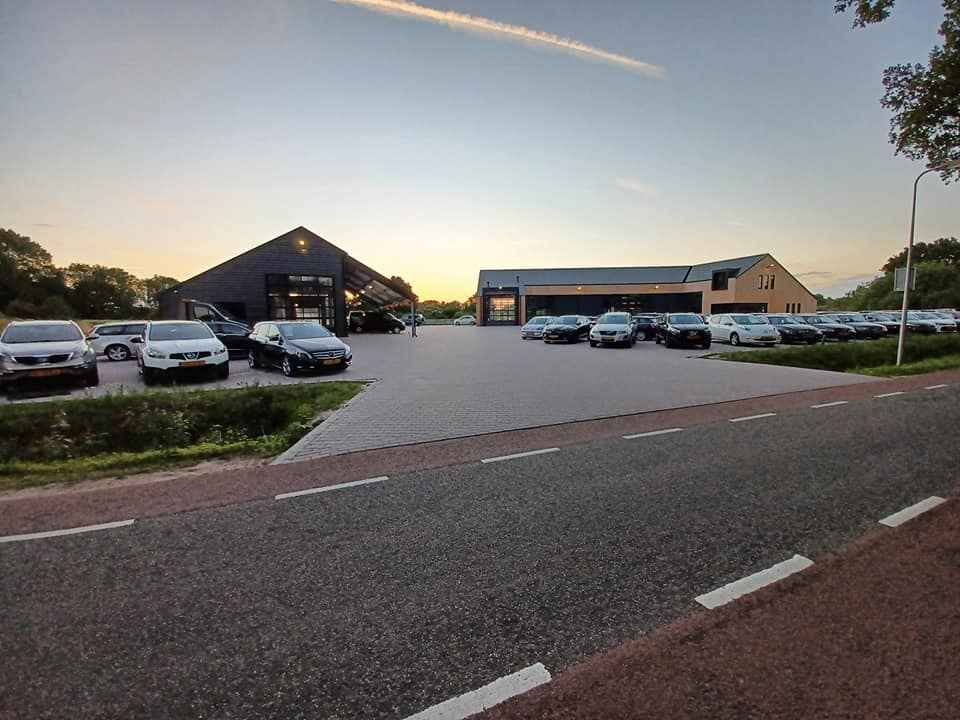

all_pictures/Dacia/Dokker/52632869/0-9a1c1ea6c83f435d8a5d77fc639569d0.jpg


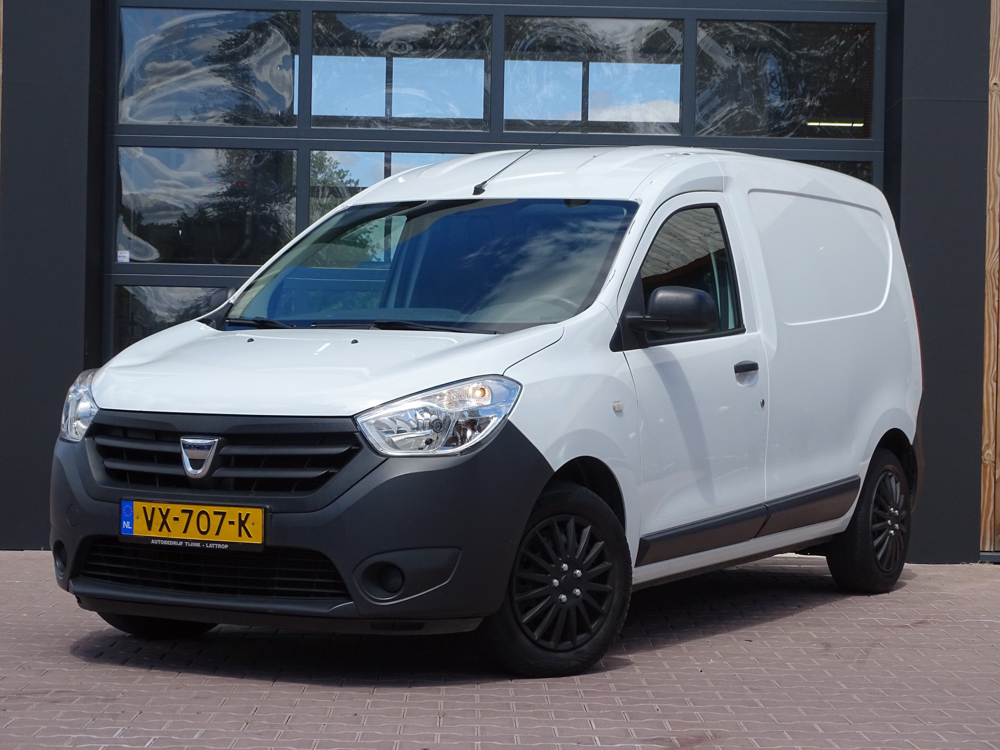

all_pictures/Dacia/Dokker/52632869/0-80f9128cb42de6cfb0d674202c53685a.jpg


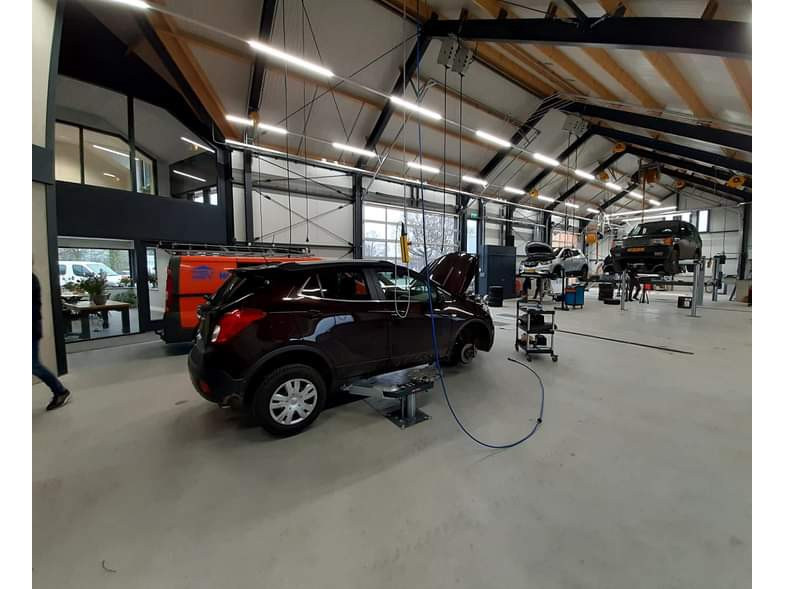

all_pictures/Dacia/Dokker/52632869/0-2d472deb7c27e4a8c95b22b4f6f8a2c7.jpg


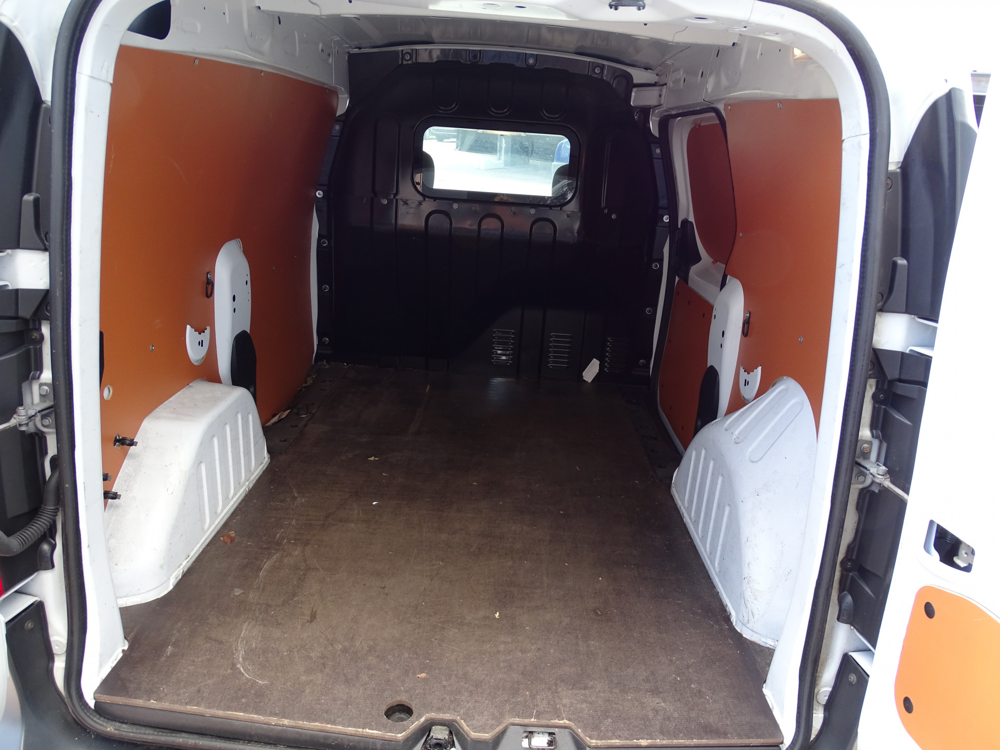

all_pictures/Dacia/Dokker/52632869/0-3c3dda35a31bb08b2c706ee2cccaa9b5.jpg


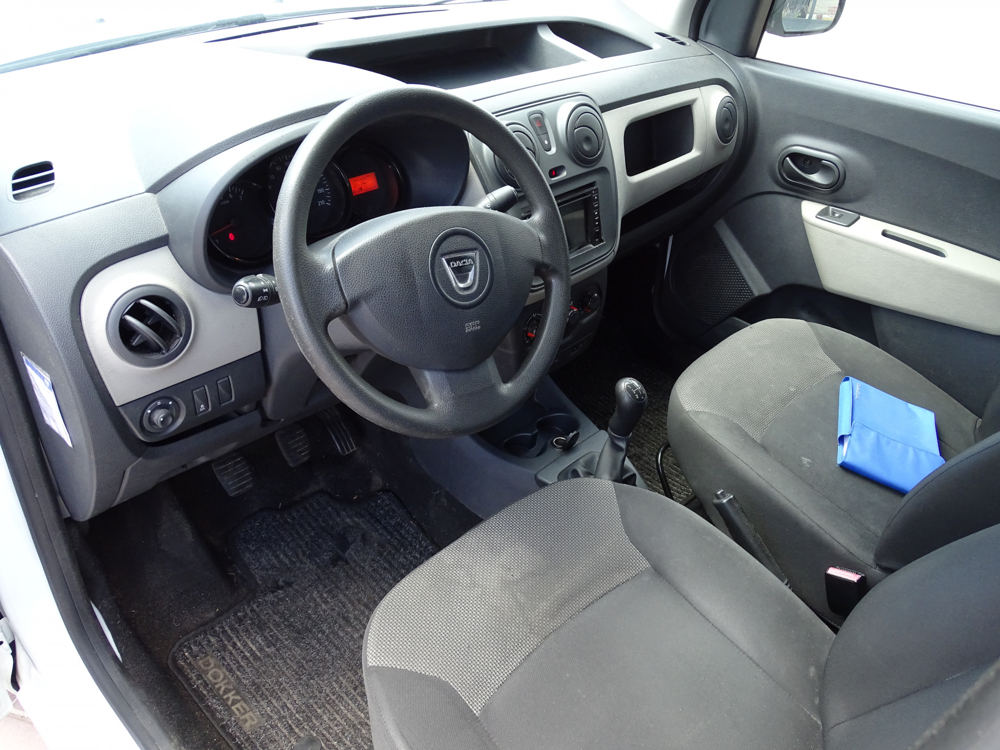

all_pictures/Dacia/Dokker/52632869/0-606bb751225b589ba607ac9f9f3e4b55.jpg


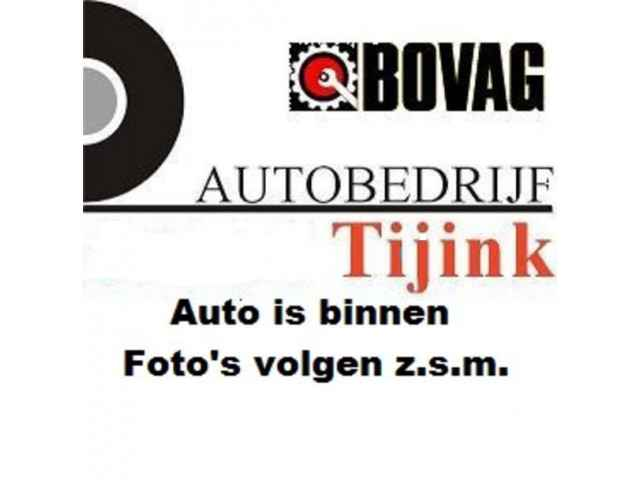

In [22]:
def show_data(bucket: str, boto_s3: boto3.client("s3"), s3fs_: s3fs.S3FileSystem()):
    image_path = pipeline.keys()
    for im in image_path:
        # Remove the first part of the path
        image_path = "/".join(im.split("/")[1:])
        # Open the image
        print(image_path)
        image_data = boto_s3.get_object(Bucket=bucket, Key=image_path)['Body'].read()
        image = Image.open(io.BytesIO(image_data))
        # Display the image
        image.show()

show_data(bucket="dpgos-osdata-boaz-beukers-sandbox",
            boto_s3=boto3_s3,
            s3fs_=s3fs_)

# Transfrable to other domains? Test

In [55]:
def preprocess_image_boat(image_path):
    # Open the image file
    image = Image.open(image_path)

    # Convert to RGB if not already
    if image.mode != 'RGB':
        image = image.convert('RGB')

    # Resize the image to match the expected input shape
    transform = transforms.Compose([
        transforms.Resize((384, 384)),  # Resize to match the model's input shape
        transforms.ToTensor(),  # Convert PIL image to PyTorch tensor
    ])
    image_tensor = transform(image)
    image_tensor = image_tensor.unsqueeze(0)
    return image_tensor

In [37]:
processed_image = preprocess_image_boat('motor_fs.jpg')
print(processed_image.shape)
labels = vit_predict_test_embeddings(processed_image,joblib.load("angle_model.pkl"))
labels

torch.Size([1, 3, 384, 384])
Loaded pretrained weights.
Time taken for testing: 1.7732384204864502 seconds


array([4])